In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv("DataCoSupplyChainDataset.csv", encoding_errors="ignore")
df

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 11:24,Standard Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,CASH,4,4,40.000000,399.980011,Shipping on time,0,45,Fishing,Brooklyn,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 3:40,Standard Class
180515,DEBIT,3,2,-613.770019,395.980011,Late delivery,1,45,Fishing,Bakersfield,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/19/2016 1:34,Second Class
180516,TRANSFER,5,4,141.110001,391.980011,Late delivery,1,45,Fishing,Bristol,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 21:00,Standard Class
180517,PAYMENT,3,4,186.229996,387.980011,Advance shipping,0,45,Fishing,Caguas,...,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/18/2016 20:18,Standard Class


# Data Preprocessing

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

In [4]:
df.describe()

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,...,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Price,Product Status
count,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180516.000000,180519.000000,180519.000000,...,180519.000000,180519.000000,180519.000000,180519.000000,24840.000000,180519.000000,180519.000000,0.0,180519.000000,180519.0
mean,3.497654,2.931847,21.974989,183.107609,0.548291,31.851451,6691.379495,35921.126914,5.443460,29.719955,...,2.127638,203.772096,183.107609,21.974989,55426.132327,692.509764,31.851451,NaN,141.232550,0.0
std,1.623722,1.374449,104.433526,120.043670,0.497664,15.640064,4162.918106,37542.461122,1.629246,9.813646,...,1.453451,132.273077,120.043670,104.433526,31919.279101,336.446807,15.640064,NaN,139.732492,0.0
min,0.000000,0.000000,-4274.979980,7.490000,0.000000,2.000000,1.000000,603.000000,2.000000,-33.937553,...,1.000000,9.990000,7.490000,-4274.979980,1040.000000,19.000000,2.000000,NaN,9.990000,0.0
25%,2.000000,2.000000,7.000000,104.379997,0.000000,18.000000,3258.500000,725.000000,4.000000,18.265432,...,1.000000,119.980003,104.379997,7.000000,23464.000000,403.000000,18.000000,NaN,50.000000,0.0
50%,3.000000,4.000000,31.520000,163.990005,1.000000,29.000000,6457.000000,19380.000000,5.000000,33.144863,...,1.000000,199.919998,163.990005,31.520000,59405.000000,627.000000,29.000000,NaN,59.990002,0.0
75%,5.000000,4.000000,64.800003,247.399994,1.000000,45.000000,9779.000000,78207.000000,7.000000,39.279617,...,3.000000,299.950012,247.399994,64.800003,90008.000000,1004.000000,45.000000,NaN,199.990005,0.0
max,6.000000,4.000000,911.799988,1939.989990,1.000000,76.000000,20757.000000,99205.000000,12.000000,48.781933,...,5.000000,1999.989990,1939.989990,911.799988,99301.000000,1363.000000,76.000000,NaN,1999.989990,0.0


In [5]:
df.isna().sum()

Type                                  0
Days for shipping (real)              0
Days for shipment (scheduled)         0
Benefit per order                     0
Sales per customer                    0
Delivery Status                       0
Late_delivery_risk                    0
Category Id                           0
Category Name                         0
Customer City                         0
Customer Country                      0
Customer Email                        0
Customer Fname                        0
Customer Id                           0
Customer Lname                        8
Customer Password                     0
Customer Segment                      0
Customer State                        0
Customer Street                       0
Customer Zipcode                      3
Department Id                         0
Department Name                       0
Latitude                              0
Longitude                             0
Market                                0


In [6]:
df.drop(["Customer Email","Customer Password","Product Image","Customer Fname","Customer Fname"],axis=1,inplace=True)

In [7]:
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,COMPLETE,NaN,1360,73,NaN,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,PENDING,NaN,1360,73,NaN,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,CLOSED,NaN,1360,73,NaN,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,COMPLETE,NaN,1360,73,NaN,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,PENDING_PAYMENT,NaN,1360,73,NaN,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [8]:
df.rename(columns={"Type":"Type Of Payments"},inplace=True)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 49 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type Of Payments               180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Id                    180519 non-null  int64  
 12  Customer Lname                

# Data Anlysis and Visualization

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

Order status 

In [14]:
df1=df["Order Status"].value_counts()
df1

COMPLETE           59491
PENDING_PAYMENT    39832
PROCESSING         21902
PENDING            20227
CLOSED             19616
ON_HOLD             9804
SUSPECTED_FRAUD     4062
CANCELED            3692
PAYMENT_REVIEW      1893
Name: Order Status, dtype: int64

Text(0.5, 1.0, 'Order Status')

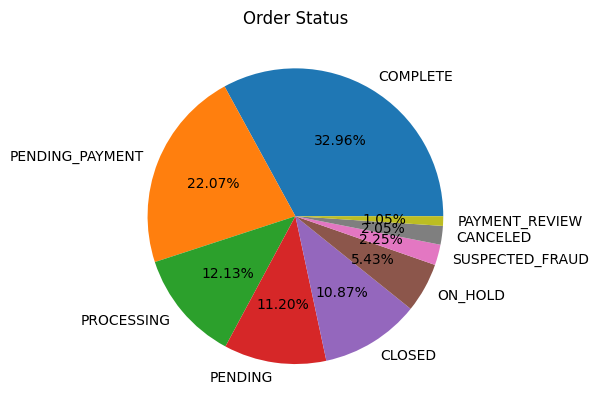

In [15]:
label=["COMPLETE","PENDING_PAYMENT","PROCESSING","PENDING","CLOSED","ON_HOLD","SUSPECTED_FRAUD","CANCELED","PAYMENT_REVIEW"]
plt.pie(df1,labels=label, autopct='%1.2f%%')
plt.title("Order Status")

How many successfully processed orders have days for shipping real (Real) > Days for shipment (Scheduled)

In [16]:
suc_pro=df[(df["Days for shipping (real)"])>(df["Days for shipment (scheduled)"])]

In [17]:
suc_pro=suc_pro[(suc_pro["Order Status"]== "COMPLETE")]
suc_pro

,Type Of Payments,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
6,DEBIT,2,1,95.180000,288.420013,Late delivery,1,73,Sporting Goods,Caguas,...,COMPLETE,NaN,1360,73,NaN,Smart watch,327.750000,0,1/15/2018 10:42,First Class
13,DEBIT,2,1,24.580000,245.809998,Late delivery,1,73,Sporting Goods,Caguas,...,COMPLETE,NaN,1360,73,NaN,Smart watch,327.750000,0,1/15/2018 8:15,First Class
15,DEBIT,2,1,-259.579987,324.470001,Late delivery,1,73,Sporting Goods,Caguas,...,COMPLETE,NaN,1360,73,NaN,Smart watch,327.750000,0,1/15/2018 7:33,First Class
18,DEBIT,2,1,102.260002,314.640015,Late delivery,1,73,Sporting Goods,Caguas,...,COMPLETE,NaN,1360,73,NaN,Smart watch,327.750000,0,1/15/2018 6:30,First Class
25,DEBIT,6,2,131.169998,285.140015,Late delivery,1,73,Sporting Goods,Caguas,...,COMPLETE,NaN,1360,73,NaN,Smart watch,327.750000,0,1/19/2018 4:03,Second Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180479,DEBIT,6,4,133.839996,395.980011,Late delivery,1,45,Fishing,Las Vegas,...,COMPLETE,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/23/2016 22:24,Standard Class
180499,DEBIT,4,2,-258.779999,387.980011,Late delivery,1,45,Fishing,Caguas,...,COMPLETE,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 17:41,Second Class
180508,DEBIT,4,2,85.000000,339.980011,Late delivery,1,45,Fishing,Waipahu,...,COMPLETE,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 7:10,Second Class
180512,DEBIT,6,4,86.400002,319.980011,Late delivery,1,45,Fishing,Caguas,...,COMPLETE,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/22/2016 6:07,Standard Class


In [18]:
#by country

delivery_status=suc_pro.groupby(["Order Country"])["Order Status"].count().reset_index(name="Number of orders")
px.bar(delivery_status,x=delivery_status["Order Country"],y=delivery_status["Number of orders"],
       color=delivery_status["Number of orders"],
       labels={"Order Country":"Order Country","Number of orders":"Number of orders"})


List of country and number of pending orders in "Australia"

In [19]:
pending_cities=df[(df["Order Country"]=="Australia") & (df["Order Status"]=="PENDING")]
pending_cities

,Type Of Payments,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
22,TRANSFER,4,2,22.370001,298.250000,Late delivery,1,73,Sporting Goods,Rancho Cordova,...,PENDING,NaN,1360,73,NaN,Smart watch,327.750000,0,1/17/2018 5:06,Second Class
26,TRANSFER,5,2,90.540001,278.589996,Late delivery,1,73,Sporting Goods,Wilkes Barre,...,PENDING,NaN,1360,73,NaN,Smart watch,327.750000,0,1/18/2018 3:42,Second Class
370,TRANSFER,5,4,37.169998,309.720001,Late delivery,1,73,Sporting Goods,Bismarck,...,PENDING,NaN,1360,73,NaN,Smart watch,327.750000,0,1/17/2018 17:11,Standard Class
390,TRANSFER,5,4,146.139999,298.250000,Late delivery,1,73,Sporting Goods,Rio Grande,...,PENDING,NaN,1360,73,NaN,Smart watch,327.750000,0,1/17/2018 10:11,Standard Class
392,TRANSFER,3,4,-447.049988,288.420013,Advance shipping,0,73,Sporting Goods,Caguas,...,PENDING,NaN,1360,73,NaN,Smart watch,327.750000,0,1/15/2018 9:29,Standard Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180306,TRANSFER,5,2,40.400002,363.980011,Late delivery,1,45,Fishing,Mount Prospect,...,PENDING,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,2/1/2016 4:31,Second Class
180321,TRANSFER,4,4,106.389999,379.980011,Shipping on time,0,45,Fishing,Plano,...,PENDING,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/30/2016 8:54,Standard Class
180411,TRANSFER,2,4,28.500000,379.980011,Advance shipping,0,45,Fishing,Caguas,...,PENDING,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/24/2016 6:07,Standard Class
180491,TRANSFER,3,4,33.599998,335.980011,Advance shipping,0,45,Fishing,Caguas,...,PENDING,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 5:35,Standard Class


Which country and city has maximum pending order

In [20]:
order_pending=df[df["Order Status"]=="PENDING"]
order_pending

,Type Of Payments,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,PENDING,NaN,1360,73,NaN,Smart watch,327.750000,0,1/18/2018 12:27,Standard Class
11,TRANSFER,5,2,45.689999,268.760010,Late delivery,1,73,Sporting Goods,Freeport,...,PENDING,NaN,1360,73,NaN,Smart watch,327.750000,0,1/18/2018 8:57,Second Class
12,TRANSFER,4,2,21.760000,262.200012,Late delivery,1,73,Sporting Goods,Salinas,...,PENDING,NaN,1360,73,NaN,Smart watch,327.750000,0,1/17/2018 8:36,Second Class
21,TRANSFER,5,4,82.300003,304.809998,Late delivery,1,73,Sporting Goods,Caguas,...,PENDING,NaN,1360,73,NaN,Smart watch,327.750000,0,1/18/2018 5:27,Standard Class
22,TRANSFER,4,2,22.370001,298.250000,Late delivery,1,73,Sporting Goods,Rancho Cordova,...,PENDING,NaN,1360,73,NaN,Smart watch,327.750000,0,1/17/2018 5:06,Second Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180414,TRANSFER,0,0,132.130005,363.980011,Shipping on time,0,45,Fishing,Washington,...,PENDING,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/22/2016 12:51,Same Day
180458,TRANSFER,4,4,105.589996,319.980011,Shipping on time,0,45,Fishing,Caguas,...,PENDING,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/23/2016 6:59,Standard Class
180485,TRANSFER,4,4,11.160000,371.980011,Shipping on time,0,45,Fishing,San Pablo,...,PENDING,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/21/2016 14:42,Standard Class
180491,TRANSFER,3,4,33.599998,335.980011,Advance shipping,0,45,Fishing,Caguas,...,PENDING,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/20/2016 5:35,Standard Class


In [21]:
#order country
order_pending["Order Country"].value_counts()

Estados Unidos             2681
Mxico                      1526
Francia                    1500
Alemania                   1120
Australia                   944
                           ... 
Macedonia                     2
Repblica Centroafricana       2
Butn                          1
Sri Lanka                     1
Guinea Ecuatorial             1
Name: Order Country, Length: 138, dtype: int64

<AxesSubplot: title={'center': 'Countries with Pending Status'}>

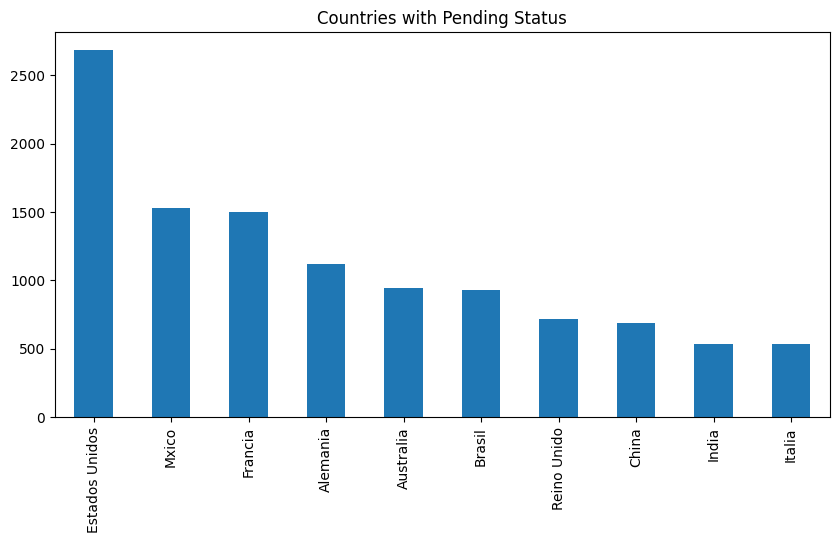

In [22]:
order_pending["Order Country"].value_counts().nlargest(10).plot.bar(figsize=(10,5), title="Countries with Pending Status")

In [23]:
#order city
order_pending["Order City"].value_counts()

Santo Domingo    248
New York City    232
Tegucigalpa      219
Los Angeles      212
Mexico City      207
                ... 
Patiala            1
Aksu               1
Tawau              1
Antakya            1
Sandnes            1
Name: Order City, Length: 2057, dtype: int64

<AxesSubplot: title={'center': 'Cities with Pending Status'}>

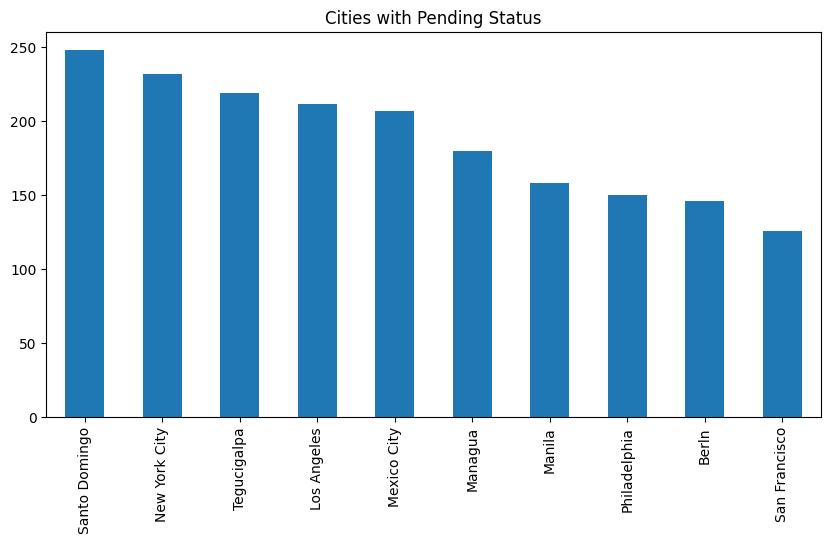

In [24]:
order_pending["Order City"].value_counts().nlargest(10).plot.bar(figsize=(10,5), title="Cities with Pending Status")

Total number of different countries

In [25]:
df['Order Country'].nunique()

164

In [26]:
df['Order Country'].value_counts()

Estados Unidos       24840
Francia              13222
Mxico                13172
Alemania              9564
Australia             8497
                     ...  
Guinea Ecuatorial        2
Kuwait                   2
Shara Occidental         2
Burundi                  1
Serbia                   1
Name: Order Country, Length: 164, dtype: int64

Which country has most suspected Fraud 

In [27]:
fraud_detected=df[df["Order Status"]=="SUSPECTED_FRAUD"]
fraud_detected

,Type Of Payments,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
10,TRANSFER,6,2,130.580002,272.029999,Shipping canceled,0,73,Sporting Goods,Caguas,...,SUSPECTED_FRAUD,NaN,1360,73,NaN,Smart watch,327.750000,0,1/19/2018 9:18,Second Class
24,TRANSFER,2,2,90.279999,288.420013,Shipping canceled,0,73,Sporting Goods,Billings,...,SUSPECTED_FRAUD,NaN,1360,73,NaN,Smart watch,327.750000,0,1/15/2018 4:24,Second Class
183,TRANSFER,5,4,28.850000,128.220001,Shipping canceled,0,13,Electronics,Freeport,...,SUSPECTED_FRAUD,77041.0,278,13,NaN,Under Armour Men's Compression EV SL Slide,44.990002,0,5/13/2016 17:42,Standard Class
184,TRANSFER,5,4,133.910004,278.970001,Shipping canceled,0,9,Cardio Equipment,Fort Washington,...,SUSPECTED_FRAUD,85234.0,191,9,NaN,Nike Men's Free 5.0+ Running Shoe,99.989998,0,4/7/2016 19:51,Standard Class
185,TRANSFER,6,4,79.160004,272.970001,Shipping canceled,0,9,Cardio Equipment,Bakersfield,...,SUSPECTED_FRAUD,95123.0,191,9,NaN,Nike Men's Free 5.0+ Running Shoe,99.989998,0,8/20/2016 2:51,Standard Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180274,TRANSFER,5,2,163.190002,339.980011,Shipping canceled,0,45,Fishing,Caguas,...,SUSPECTED_FRAUD,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,2/3/2016 3:49,Second Class
180309,TRANSFER,2,1,114.830002,347.980011,Shipping canceled,0,45,Fishing,Modesto,...,SUSPECTED_FRAUD,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/28/2016 21:52,First Class
180352,TRANSFER,4,4,90.000000,399.980011,Shipping canceled,0,45,Fishing,Albuquerque,...,SUSPECTED_FRAUD,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/29/2016 3:08,Standard Class
180406,TRANSFER,6,4,-333.179993,399.980011,Shipping canceled,0,45,Fishing,Caguas,...,SUSPECTED_FRAUD,NaN,1004,45,NaN,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/28/2016 12:46,Standard Class


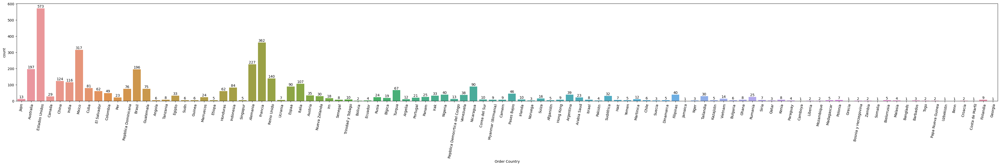

In [28]:
#order Country
plt.figure(figsize=(50,5))

ax=sns.countplot(data=fraud_detected,x="Order Country")
ax.set_xticklabels(ax.get_xticklabels(),rotation=80)
for i in ax.containers:
    ax.bar_label(i,)

plt.show()

In [29]:
#customer country
fraud_detected["Customer Country"].value_counts()

EE. UU.        2413
Puerto Rico    1649
Name: Customer Country, dtype: int64

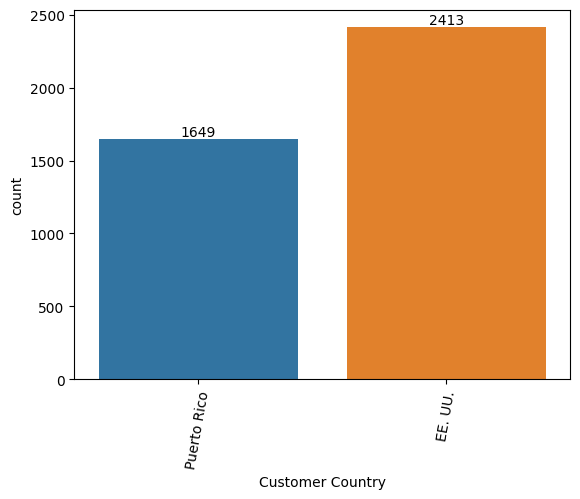

In [30]:

ax=sns.countplot(data=fraud_detected,x="Customer Country")
ax.set_xticklabels(ax.get_xticklabels(),rotation=80)
for i in ax.containers:
    ax.bar_label(i,)
plt.show()

Which product has maximum discount

In [31]:
df2=pd.DataFrame(df, columns=["Product Name","Order Item Discount"])
df2.groupby(["Product Name","Order Item Discount"]).sum().sort_values(by="Order Item Discount",ascending=False).head(1)

,
Product Name,Order Item Discount
SOLE E35 Elliptical,500.0


Delivery Status

In [86]:
#By Order
delivery_status=df.groupby(["Delivery Status"])["Order Id"].count().reset_index(name="Number of orders")
px.bar(delivery_status,x=delivery_status["Delivery Status"],y=delivery_status["Number of orders"],
       labels={"Delivery Status":"Delivery Status","Number of orders":"Number of orders"},
      title="Categorised Orders with delivery status")


In [33]:
#By Order Ragion
delivery_status_region=df.groupby(["Delivery Status","Order Region"])["Order Id"].count().reset_index(name="Number of orders")
px.bar(delivery_status_region,x="Delivery Status",y="Number of orders",
       color=delivery_status_region["Order Region"],
       labels={"Delivery Status":"Delivery Status","Number of orders":"Number of orders"})

Which item has maximum profit ratio

In [34]:
profit_data=df.groupby(["Product Name"])["Order Item Profit Ratio"].count().reset_index(name="Profit").sort_values(by="Profit",ascending=False).head(10)
px.bar(profit_data,x=profit_data["Product Name"],y=profit_data["Profit"],
        labels={"Product Name":"Product Name","Profit":"Profit"})

Top 10 Customer by profit

In [35]:
df["Customer_ID_STR"]=df['Customer Id'].astype(str)

customer_profit=df.groupby(["Customer_ID_STR"])["Order Profit Per Order"].sum().reset_index(name="Profit").sort_values(by="Profit",ascending=False).head(10)
px.bar(customer_profit,x=customer_profit["Profit"],y=customer_profit["Customer_ID_STR"],
       color=customer_profit["Profit"],
       labels={"Customer_ID_STR":"Customer_ID_STR","Profit":"Profit"},
      title="Which customer is has maximum profit")

Types of payment modes

In [36]:
df1=df["Type Of Payments"].value_counts()
df1

DEBIT       69295
TRANSFER    49883
PAYMENT     41725
CASH        19616
Name: Type Of Payments, dtype: int64

In [37]:
#By Customer City

payment_mode=df.groupby(["Type Of Payments","Customer City"])["Order Id"].sum().reset_index(name="Number of orders").sort_values(by="Number of orders",ascending=False)
px.bar(payment_mode,x="Type Of Payments",y="Number of orders",
       color=payment_mode["Customer City"],
       labels={"Type Of Payments":"Type Of Payments","Number of orders":"Number of orders"})

Type of shipping mode

In [38]:
df1=df["Shipping Mode"].value_counts()
df1

Standard Class    107752
Second Class       35216
First Class        27814
Same Day            9737
Name: Shipping Mode, dtype: int64

Text(0.5, 1.0, 'Shipping Status')

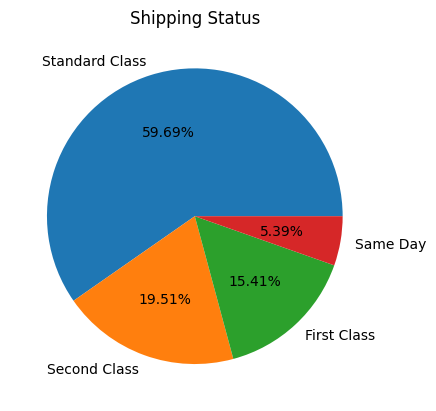

In [39]:
label=["Standard Class","Second Class","First Class","Same Day"]
plt.pie(df1,labels=label, autopct="%.2f%%")
plt.title("Shipping Status")

In [40]:
# By Ragion

shipping_mode_region=df.groupby(["Shipping Mode","Order Region"])["Order Id"].sum().reset_index(name="Number of orders")
px.bar(shipping_mode_region,x="Shipping Mode",y="Number of orders",
       color=shipping_mode_region["Order Region"],
       labels={"Shipping Mode":"Shipping Mode","Number of orders":"Number of orders"})

Which product has maximum price

In [41]:
df2=pd.DataFrame(df, columns=["Product Name","Product Price"])
df2.groupby(["Product Name","Product Price"]).sum().sort_values(by="Product Price",ascending=False)


,
Product Name,Product Price
SOLE E35 Elliptical,1999.98999
Dell Laptop,1500.00000
SOLE E25 Elliptical,999.98999
Bowflex SelectTech 1090 Dumbbells,599.98999
Bushnell Pro X7 Jolt Slope Rangefinder,599.98999
...,...
Hirzl Women's Hybrid Golf Glove,14.99000
Hirzl Men's Hybrid Golf Glove,14.99000
Toys,11.54000


Customer segment

In [42]:
df1=df["Customer Segment"].value_counts()
df1

Consumer       93504
Corporate      54789
Home Office    32226
Name: Customer Segment, dtype: int64

Text(0.5, 1.0, 'Customer Segment')

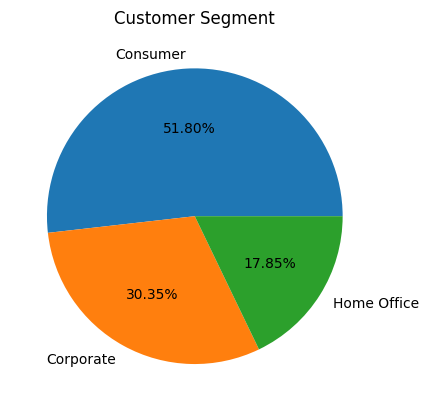

In [43]:
label=["Consumer","Corporate","Home Office"]
plt.pie(df1,labels=label, autopct="%.2f%%")
plt.title("Customer Segment")

Maximum Category Orders

In [84]:
category_name=df.groupby(["Category Name"])["Order Id"].count().reset_index(name="Orders").sort_values(by="Orders",ascending=True)
px.bar(category_name,x=category_name["Orders"],y=category_name["Category Name"],
       color=category_name["Orders"],
       labels={"Category Name":"Category Name","Orders":"Orders"},
      title="Maximum Category Orders")

Order benefits per order in specific country

In [45]:
geo_df = df.groupby(['Order Country'])['Benefit per order'].count().reset_index(name='total order').sort_values(by='total order',ascending=True)
fig = px.choropleth(geo_df ,  locationmode='country names', locations='Order Country',
                    color='total order',hover_name='Order Country')
fig.show()                                                                                                                

Sales per year,month and day date

In [46]:
df['year'] = df['order date (DateOrders)'].apply(lambda x: x.split('/')[-1].split(' ')[0])

In [47]:
df['month'] = df['order date (DateOrders)'].apply(lambda x: x.split('/')[0].split(' ')[0])

In [48]:
df['day date'] = df['order date (DateOrders)'].apply(lambda x: x.split('/')[1].split(' ')[0])

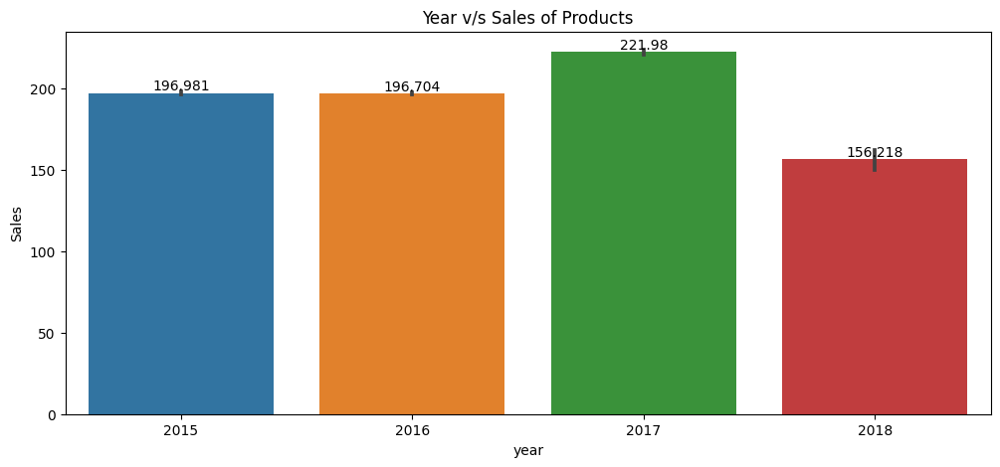

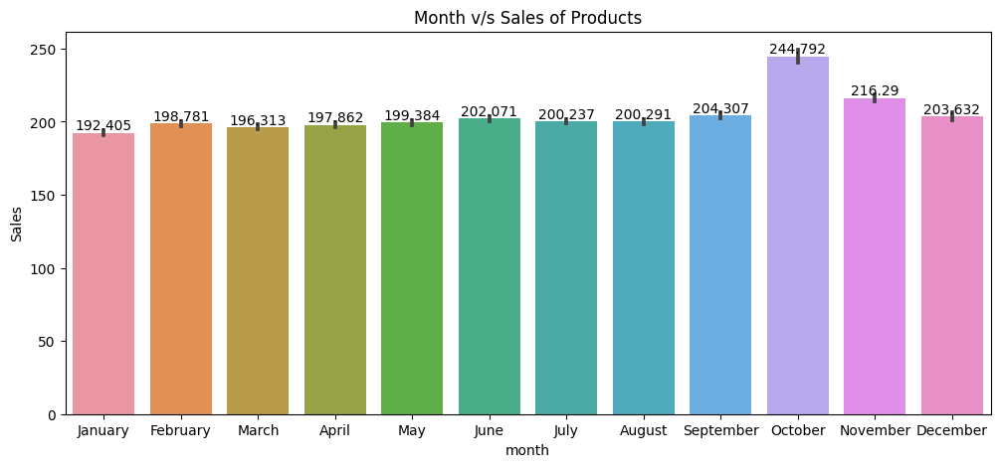

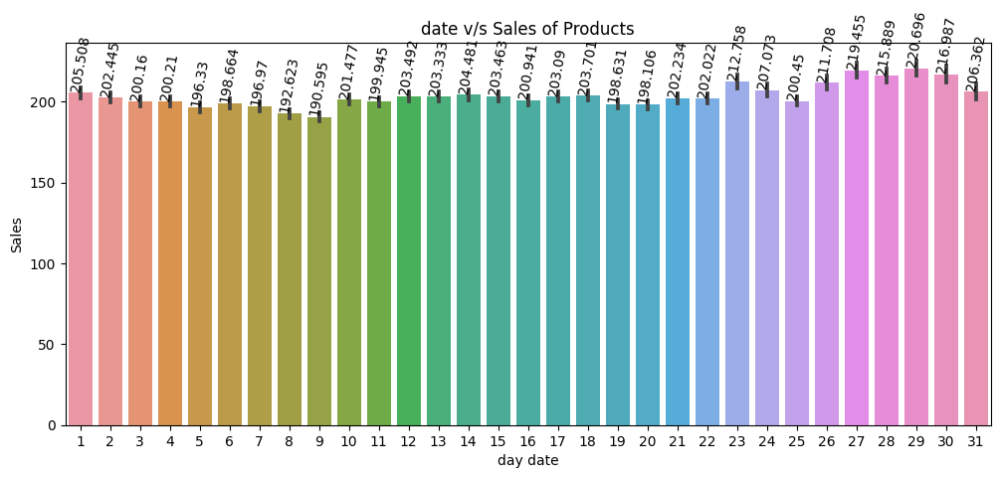

In [49]:

plt.figure(figsize = (12,5))
plt.title('Year v/s Sales of Products')
ax=sns.barplot(x = 'year', 
            y = 'Sales', 
              order=["2015","2016","2017","2018"],
            data = df);
for i in ax.containers:
    ax.bar_label(i,)

plt.figure(figsize = (12,5))
df["month"]=df["month"].replace(['1','2','3','4','5','6','7','8','9','10','11','12'],["January","February", "March", "April", "May", "June", "July", "August", "September", "October", "November","December"])
plt.title('Month v/s Sales of Products')
ax=sns.barplot(x = 'month', 
            y = 'Sales',
            order=["January","February", "March", "April", "May", "June", "July", "August", "September", "October", "November","December"],
            data=df);
for i in ax.containers:
    ax.bar_label(i,)
    
plt.figure(figsize = (12,5))
plt.title('date v/s Sales of Products')
ax=sns.barplot(x = 'day date', 
            y = 'Sales', 
            order=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23','24','25','26','27','28','29','30','31'],
            data = df);
for i in ax.containers:
    ax.bar_label(i,rotation=80)
plt.show()

# Data Modeling

Encoding label

In [50]:
from sklearn.preprocessing import LabelEncoder

In [51]:
le=LabelEncoder()
def Labelencoder_feature(x):
    le=LabelEncoder()
    x=le.fit_transform(x)
    return x

Forcasting sales of different product

In [52]:
data_sales=df[['Type Of Payments','Benefit per order', 'Sales per customer', 'Delivery Status','Late_delivery_risk', 
             'Category Name', 'Customer City','Customer Country','Customer Id','Customer Segment',
             'Customer State', 'Customer Zipcode','Department Name', 'Latitude', 'Longitude', 'Market',
             'Order City', 'Order Country', 'Order Customer Id','order date (DateOrders)', 'Order Id', 
             'Order Item Cardprod Id','Order Item Discount', 'Order Item Discount Rate', 'Order Item Id',
             'Order Item Product Price', 'Order Item Profit Ratio','Order Item Quantity', 'Sales', 
             'Order Item Total','Order Profit Per Order', 'Order Region', 'Order State', 'Order Status',
             'Order Zipcode', 'Product Card Id', 'Product Category Id','Product Description', 
             'Product Name', 'Product Price','Product Status', 'shipping date (DateOrders)', 'Shipping Mode']]

In [53]:
features=data_sales.drop(columns=['Sales', 'Order Item Quantity', 'Order Item Product Price'])
target=data_sales['Sales'].astype(str)


In [54]:
features=features.apply(Labelencoder_feature)
features.head()

,Type Of Payments,Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Id,Customer Segment,...,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,1,18934,2568,0,0,40,66,1,20649,0,...,2,609,114,47,0,78,62,0,27149,3
1,3,2272,2559,1,1,40,66,1,19386,0,...,5,609,114,47,0,78,62,0,2209,3
2,0,2293,2555,3,0,40,452,0,19385,0,...,1,609,114,47,0,78,62,0,1980,3
3,1,13638,2546,0,0,40,285,0,19384,2,...,2,609,114,47,0,78,62,0,1752,3
4,2,20599,2526,0,0,40,66,1,19383,1,...,6,609,114,47,0,78,62,0,1528,3


In [55]:
final_features=features[['Benefit per order', 'Sales per customer', 'Category Name',
       'Customer Id', 'Customer Segment', 'Department Name', 'Market',
       'Order City', 'Order Customer Id', 'order date (DateOrders)',
       'Order Id', 'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Id', 'Order Item Total', 'Order Profit Per Order',
       'Order Region', 'Order State', 'Order Zipcode', 'Product Card Id',
       'Product Category Id', 'Product Name', 'Product Price',
       'shipping date (DateOrders)']]

In [56]:
final_features


,Benefit per order,Sales per customer,Category Name,Customer Id,Customer Segment,Department Name,Market,Order City,Order Customer Id,order date (DateOrders),...,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Zipcode,Product Card Id,Product Category Id,Product Name,Product Price,shipping date (DateOrders)
0,18934,2568,40,20649,0,4,3,332,20649,5961,...,2568,18934,15,475,609,114,47,78,62,27149
1,2272,2559,40,19386,0,4,3,392,19386,1147,...,2559,2272,13,841,609,114,47,78,62,2209
2,2293,2555,40,19385,0,4,3,392,19385,1146,...,2555,2293,13,841,609,114,47,78,62,1980
3,13638,2546,40,19384,2,4,3,3226,19384,1145,...,2546,13638,11,835,609,114,47,78,62,1752
4,20599,2526,40,19383,1,4,3,3226,19383,1144,...,2526,20599,11,835,609,114,47,78,62,1528
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,15208,2752,18,992,2,3,3,2921,992,1774,...,2752,15208,7,914,609,96,30,24,66,2733
180515,422,2743,18,9066,1,3,3,1362,9066,1758,...,2743,422,7,770,609,96,30,24,66,2339
180516,20768,2734,18,288,1,3,3,25,288,1526,...,2734,20768,11,88,609,96,30,24,66,2727
180517,21463,2725,18,2781,0,3,3,25,2781,1524,...,2725,21463,11,88,609,96,30,24,66,2114


In [57]:
final_data=pd.concat([final_features,target],axis=1)
final_data.columns

Index(['Benefit per order', 'Sales per customer', 'Category Name',
       'Customer Id', 'Customer Segment', 'Department Name', 'Market',
       'Order City', 'Order Customer Id', 'order date (DateOrders)',
       'Order Id', 'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Id', 'Order Item Total', 'Order Profit Per Order',
       'Order Region', 'Order State', 'Order Zipcode', 'Product Card Id',
       'Product Category Id', 'Product Name', 'Product Price',
       'shipping date (DateOrders)', 'Sales'],
      dtype='object')

<AxesSubplot: >

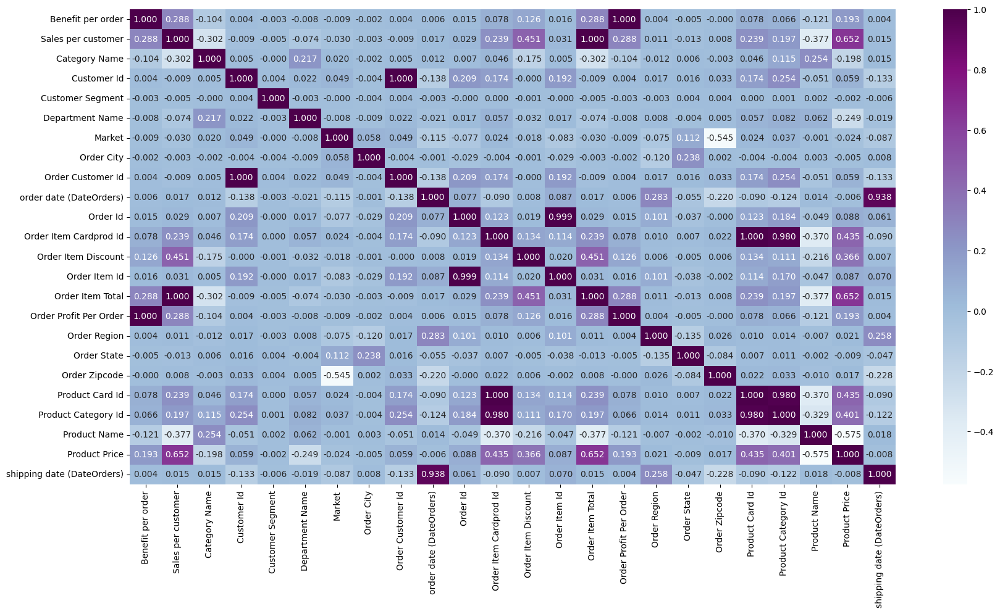

In [58]:
fig=plt.figure(figsize=(20,10))
sns.heatmap(final_data.corr(),annot=True,fmt=".3f",cmap="BuPu")

In [59]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn import *
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import Ridge
from sklearn.preprocessing import *
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import svm
from sklearn.naive_bayes import GaussianNB  
from sklearn.neighbors import KNeighborsClassifier
import pickle

LinearRegression model

In [57]:
X_train,X_test,y_train,y_test=train_test_split(final_features,target,test_size=0.3)

In [58]:
linReg=LinearRegression()
linmodel=linReg.fit(X_train,y_train)

In [59]:
y_pred =linReg.predict(X_test)
y_pred

array([209.67148843, 148.46422165, 176.95297493, ..., 131.17154988,
        27.18973218, 242.62979959])

In [60]:
ln_score=r2_score(y_test,y_pred)
print("r2 socre is:" ,ln_score)
print("mean_sqrd_error is",mean_squared_error(y_test,y_pred))
print("root_mean_squared error of is",np.sqrt(mean_squared_error(y_test,y_pred)))

r2 socre is: 0.7999894580231477
mean_sqrd_error is 3445.7043566320094
root_mean_squared error of is 58.700122288049876


In [61]:
lin_train_predict = pd.DataFrame({'actual' : y_train,
                                 'predicted' : linmodel.predict(X_train)})
lin_train_predict.head(10)

,actual,predicted
113516,149.9400024,140.714232
92070,200.0,212.314625
33964,461.480011,417.473650
980,299.9500122,286.555485
112353,99.95999908,97.994217
94548,532.5800171,481.345104
28909,99.94999695,128.133349
20667,299.980011,339.109681
34110,399.980011,378.320859
93551,215.8200073,276.468486


Lasso

In [62]:
X_train,X_test,y_train,y_test=train_test_split(final_features,target,test_size=0.3)

In [63]:
lasReg=Lasso()
lasmodel=lasReg.fit(X_train,y_train)

In [64]:
y_prediction =lasReg.predict(X_test)
y_prediction

array([381.75093504, 151.38177383, 271.25677853, ..., 336.51328742,
       390.51865454,  -4.62613955])

In [65]:
ls_score=r2_score(y_test,y_prediction)
print("r2 socre is:" ,ls_score)
print("mean_sqrd_error is",mean_squared_error(y_test,y_prediction))
print("root_mean_squared error of is",np.sqrt(mean_squared_error(y_test,y_prediction)))

r2 socre is: 0.7862674109622336
mean_sqrd_error is 3815.7143152280805
root_mean_squared error of is 61.77146845614147


Ridge regression

In [66]:
X_train,X_test,y_train,y_test=train_test_split(final_features,target,test_size=0.3)

In [67]:
ridReg=Ridge()
ridmodel=ridReg.fit(X_train,y_train)

In [68]:
y_prediction =ridReg.predict(X_test)
y_prediction

array([401.54962427, -36.83229213, 132.6123187 , ..., 131.74775535,
       116.56586155, 215.20308513])

In [69]:
rd_score=r2_score(y_test,y_prediction)
print("r2 socre is:" ,rd_score)
print("mean_sqrd_error is",mean_squared_error(y_test,y_prediction))
print("root_mean_squared error of is",np.sqrt(mean_squared_error(y_test,y_prediction)))

r2 socre is: 0.7878226577580927
mean_sqrd_error is 3762.6936258371093
root_mean_squared error of is 61.34079903161606


KNN

In [70]:
X_train,X_test,y_train,y_test=train_test_split(final_features,target,test_size=0.3)

In [71]:
knncls=KNeighborsClassifier()
knncls.fit(X_train,y_train)

KNeighborsClassifier()

In [72]:
y_prediction =knncls.predict(X_test)
y_prediction

array(['150.0', '179.9700012', '129.9900055', ..., '129.9900055',
       '119.9800034', '399.980011'], dtype=object)

In [73]:
knn_score=r2_score(y_test,y_prediction)
print("r2 socre is:" ,knn_score)
print("mean_sqrd_error is",mean_squared_error(y_test,y_prediction))
print("root_mean_squared error of is",np.sqrt(mean_squared_error(y_test,y_prediction)))

r2 socre is: 0.5642084130939176
mean_sqrd_error is 7679.681627442064
root_mean_squared error of is 87.63379272542107


In [74]:
print(classification_report(y_test,y_prediction))

              precision    recall  f1-score   support

       100.0       0.07      0.18      0.10      1294
 103.9800034       0.00      0.00      0.00        34
 104.9700012       0.01      0.03      0.02        32
       108.0       0.00      0.00      0.00        21
 109.9400024       0.00      0.00      0.00        19
 109.9499969       0.01      0.03      0.01        37
 109.9899979       0.00      0.00      0.00        30
 11.28999996       0.94      0.98      0.96        81
 11.53999996       0.94      0.99      0.97       144
       110.0       0.00      0.00      0.00        17
 111.9599991       0.00      0.00      0.00        21
 119.9599991       0.00      0.00      0.00        23
 119.9700012       0.02      0.05      0.03       645
 119.9800034       0.05      0.10      0.07      1566
 119.9899979       0.03      0.04      0.03        25
       120.0       0.00      0.00      0.00        57
 124.9499969       0.01      0.02      0.02       129
 124.9899979       0.03    

Naive bayes

In [75]:
X_train,X_test,y_train,y_test=train_test_split(final_features,target,test_size=0.3)

In [76]:
sc=StandardScaler()

In [77]:
x_scaler=sc.fit_transform(final_features)

In [78]:
pipe=Pipeline(steps=[("sc",sc),("Guaasinnb", GaussianNB())])

In [79]:
pipe.fit(X_train, y_train)

Pipeline(steps=[('sc', StandardScaler()), ('Guaasinnb', GaussianNB())])

In [80]:
gu_Score=pipe.score(X_test, y_test)
gu_Score

0.9140076815126671

SVM

In [81]:
X_train,X_test,y_train,y_test=train_test_split(final_features,target,test_size=0.3)

In [82]:
svmcls=svm.SVC()
svmodel=svmcls.fit(X_train,y_train)

In [83]:
y_prediction =svmcls.predict(X_test)
y_prediction

array(['129.9900055', '399.980011', '129.9900055', ..., '129.9900055',
       '129.9900055', '399.980011'], dtype=object)

In [84]:
svc_score=r2_score(y_test,y_prediction)
print("r2 socre is:" ,svc_score)
print("mean_sqrd_error is",mean_squared_error(y_test,y_prediction))
print("root_mean_squared error of is",np.sqrt(mean_squared_error(y_test,y_prediction)))

r2 socre is: 0.4616098392987247
mean_sqrd_error is 9459.018463270424
root_mean_squared error of is 97.25748538426451


Gradient Boost

In [87]:
X_train,X_test,y_train,y_test=train_test_split(final_features,target,test_size=0.3)

In [88]:
xgbcls=GradientBoostingClassifier()
xgbmodel=xgbcls.fit(X_train,y_train)

In [89]:
y_prediction =xgbcls.predict(X_test)
y_prediction

array(['179.9700012', '399.980011', '99.94999695', ..., '199.9199982',
       '149.9400024', '239.9600067'], dtype=object)

In [90]:
gb_score=r2_score(y_test,y_prediction)
print("r2 socre is:" ,gb_score)
print("mean_sqrd_error is",mean_squared_error(y_test,y_prediction))
print("root_mean_squared error of is",np.sqrt(mean_squared_error(y_test,y_prediction)))

r2 socre is: 0.6421945174755332
mean_sqrd_error is 6372.184213415568
root_mean_squared error of is 79.82596202624536


decison tree

In [60]:
X_train,X_test,y_train,y_test=train_test_split(final_features,target,test_size=0.3)

In [61]:
dectreecls=DecisionTreeClassifier()
dectreecls.fit(X_train,y_train)

DecisionTreeClassifier()

In [62]:
y_prediction =dectreecls.predict(X_test)
y_prediction

array(['299.9700012', '199.9199982', '199.9900055', ..., '399.980011',
       '299.980011', '100.0'], dtype=object)

In [63]:
dt_score=r2_score(y_test,y_prediction)
print("r2 socre is:" ,dt_score)
print("mean_sqrd_error is",mean_squared_error(y_test,y_prediction))
print("root_mean_squared error of is",np.sqrt(mean_squared_error(y_test,y_prediction)))

r2 socre is: 0.9998473619184732
mean_sqrd_error is 2.7362507675226366
root_mean_squared error of is 1.6541616509648132


Random Forest

In [71]:
X_train,X_test,y_train,y_test=train_test_split(final_features,target,test_size=0.3)

In [72]:
rfcls=RandomForestClassifier(random_state=42)
rfmodel=rfcls.fit(X_train,y_train)

In [73]:
y_prediction =rfcls.predict(X_test)
y_prediction

array(['199.9199982', '399.9599915', '199.9799957', ..., '79.98000336',
       '199.9799957', '399.980011'], dtype=object)

In [74]:
rf_score=r2_score(y_test,y_prediction)
print("r2 socre is:" ,rf_score)
print("mean_sqrd_error is",mean_squared_error(y_test,y_prediction))
print("root_mean_squared error of is",np.sqrt(mean_squared_error(y_test,y_prediction)))

r2 socre is: 0.9998904717473889
mean_sqrd_error is 1.8765809290148279
root_mean_squared error of is 1.3698835457858554


In [75]:
cm=confusion_matrix(y_test, y_prediction)
cm

array([[1299,    0,    0, ...,    0,    0,    0],
       [   0,   28,    0, ...,    0,    0,    0],
       [   0,    0,   40, ...,    0,    0,    0],
       ...,
       [   0,    0,    0, ..., 1279,    0,    0],
       [   0,    0,    0, ...,    0,  763,    0],
       [   0,    0,    0, ...,    0,    0,    3]], dtype=int64)

In [76]:
print(classification_report(y_test,y_prediction))

              precision    recall  f1-score   support

       100.0       1.00      1.00      1.00      1299
 103.9800034       1.00      1.00      1.00        28
 104.9700012       1.00      0.98      0.99        41
       108.0       1.00      1.00      1.00        14
 109.9400024       1.00      1.00      1.00        21
 109.9499969       1.00      0.97      0.99        37
 109.9899979       1.00      1.00      1.00        28
 11.28999996       1.00      1.00      1.00        80
 11.53999996       1.00      1.00      1.00       138
       110.0       0.95      0.95      0.95        20
 111.9599991       1.00      1.00      1.00        22
 119.9599991       0.95      0.95      0.95        21
 119.9700012       1.00      1.00      1.00       655
 119.9800034       1.00      1.00      1.00      1517
 119.9899979       1.00      1.00      1.00        29
       120.0       0.98      1.00      0.99        51
 124.9499969       0.98      1.00      0.99       143
 124.9899979       1.00    

In [77]:
import plotly.graph_objs as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test, y=y_prediction, mode='markers' ,  name='predicted vs actual'))
fig.add_trace(go.Scatter(x=y_test , y=y_test, mode='lines' , name='actual'))


fig.update_layout(title='actual Sales vs predicted Sales', xaxis_title= 'Actual Score', yaxis_title = 'Predicted Score' , template= 'plotly_dark')

All algorithms accurcy in tabale

In [11]:
from tabulate import tabulate
data = [["Linear Regression", "0.79998"], 
        ["Lasso Regressor", "0.78626"], 
        ["Ridge Regressor", "0.78782"], 
        ["KNN Classifier","0.56420"],
        ["Gaussian Naive bayes","0.91400"],
        ["SVC Classifier","0.46160"],
        ["Gradient Boost","0.64219"],
        ["Random Forest","0.99989"],
        ["Decision Tree","0.99969"]]
  
col_names = ["Algorithms", "Accuracy"]
  
print(tabulate(data, headers=col_names))

Algorithms              Accuracy
--------------------  ----------
Linear Regression        0.79998
Lasso Regressor          0.78626
Ridge Regressor          0.78782
KNN Classifier           0.5642
Gaussian Naive bayes     0.914
SVC Classifier           0.4616
Gradient Boost           0.64219
Random Forest            0.99989
Decision Tree            0.99969


Create chart for accuracy of algorithms

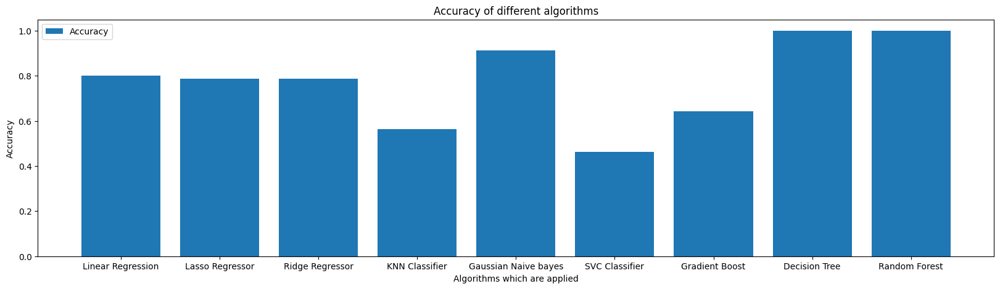

In [12]:
plt.figure(figsize = (20,5))
plt.bar(["Linear Regression","Lasso Regressor","Ridge Regressor","KNN Classifier","Gaussian Naive bayes",
         "SVC Classifier","Gradient Boost","Decision Tree","Random Forest"],
    [0.79998,0.78626,0.78782,0.56420,0.91400,0.46160,0.64219,0.99969,0.99989],label="Accuracy")
plt.legend()
plt.xlabel("Algorithms which are applied")
plt.ylabel("Accuracy")
plt.title("Accuracy of different algorithms")

plt.show()

Here, Random forest's acuuracy is high from all model. So, store this model in pickle file

In [83]:
pickle.dump(rfcls, open('model.pkl', 'wb'))